## Code to extract a regular-gridded mask so ERA5 grid can match the longitude/latitude of CRCM6 grid

In [21]:
import xarray as xr
from scipy.spatial import cKDTree
import numpy as np
import cartopy.crs as ccrs
import cartopy
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from scipy import ndimage
from shapely.geometry import MultiPoint, Point

### Plot of the original CRCM6 grid

In [ ]:
ds_rot = xr.open_dataset('/home/vdemeyer/projects/rrg-gachon/vdemeyer/UBB/PSL/psl_ubb_201201_se.nc')

pole_lon = ds_rot.rotated_pole.attrs['grid_north_pole_longitude']
pole_lat = ds_rot.rotated_pole.attrs['grid_north_pole_latitude']

plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)

fig, ax = plt.subplots(subplot_kw={'projection': plotcrs},
                       figsize=(18, 16), tight_layout = {'pad': 0})

vmin = 95000
vmax = 105000
step = 1000

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.05, axes_class=plt.Axes)

ax.set_extent([-180, -27, 85, 5], crs=ccrs.PlateCarree())
borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
lakes_color = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#7FB4D8', edgecolor='black')
lakes_edge = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='none', edgecolor='black')
img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
ax.add_feature(lakes_color, zorder=1, linewidth=0.3)
ax.add_feature(lakes_edge, zorder=2, linewidth=0.3)
ax.coastlines(resolution='10m', linewidth=0.4, color='black')
ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

sc = ax.contourf(
    ds_rot.rlon, ds_rot.rlat, ds_rot.psl.isel(time=0),
    transform = ccrs.RotatedPole(pole_longitude=pole_lon, pole_latitude=pole_lat),
    levels=np.arange(vmin, vmax+step, step),
    cmap='Spectral_r',
    extend='both'
)

cbar = fig.colorbar(sc, cax=cax, orientation="horizontal", pad=0.02, aspect=20, extend='max')
cbar.set_label("MSLP", fontsize=18)
cbar.ax.tick_params(labelsize=18)

# Masking ERA5 Data to Match a Rotated Polar Grid

We want to restrict ERA5 data to the exact domain of a **rotated polar grid**, while avoiding inclusion of points outside the real model domain. The methodology is as follows:

## 1. Flatten the rotated polar grid
- Extract all latitude and longitude points from the rotated grid and flatten them for processing.  
- Convert longitudes to 0–360° to match ERA5.

## 2. Build a quick nearest-neighbor mask using `cKDTree`
- Construct a KD-tree from the ERA5 grid points.  
- For each rotated grid point, find the nearest ERA5 point.  
- This gives a fast, coarse mask covering almost the entire domain.

## 3. Identify missing points in critical zones
- Some areas, particularly at the northern edge, may not be captured due to grid distortions.  
- Define a bounding box for the northern region (longitude: -160° to -20°, latitude ≥ 70°).  
- Select ERA5 points that are missing in this zone.

## 4. Refine the mask with Shapely convex hull
- Construct a convex hull around all rotated grid points using Shapely.  
- Test the missing ERA5 points in the defined northern zone for inclusion in the hull.  
- Update the mask for these points.

## 5. Apply the mask to ERA5 data
- Convert the final mask to an `xarray.DataArray` with the same coordinates as ERA5.  
- Use `ds_era.where(mask_da, drop=True)` to extract only points inside the rotated polar domain.

**Notes:**  
- This approach ensures the mask matches the rotated polar domain **without including points outside** on the west, east, or southern edges.  
- The convex hull is applied **only where necessary**, which keeps the method efficient.


In [22]:
# -------------------------------
# 1️⃣ Charger les fichiers
# -------------------------------
ds_rot = xr.open_dataset('/home/vdemeyer/projects/rrg-gachon/vdemeyer/UBB/PSL/psl_ubb_201201_se.nc')
ds_era = xr.open_mfdataset("/home/vdemeyer/projects/rrg-gachon/vdemeyer/ERA5/PSL/2012/01/era5_msl_ll_201201_1h.nc4")

# -------------------------------
# 2️⃣ Grille polaire aplatie
# -------------------------------
rot_lats = ds_rot['lat'].values.flatten()
rot_lons = ds_rot['lon'].values.flatten()
polar_points = np.vstack([rot_lons % 360, rot_lats]).T  # longitudes 0-360

# -------------------------------
# 3️⃣ Grille ERA5
# -------------------------------
era_lons = ds_era.longitude.values
era_lons_360 = era_lons % 360
era_lats = ds_era.latitude.values
era_lon_grid, era_lat_grid = np.meshgrid(era_lons_360, era_lats)
era_points = np.vstack([era_lon_grid.ravel(), era_lat_grid.ravel()]).T

# -------------------------------
# 4️⃣ Masque rapide avec cKDTree (quasi tous les points)
# -------------------------------
tree = cKDTree(era_points)
_, idx = tree.query(polar_points)
mask_flat = np.zeros(era_points.shape[0], dtype=bool)
mask_flat[idx] = True
mask = mask_flat.reshape(era_lon_grid.shape)

# -------------------------------
# 5️⃣ Définir la zone nord pour correction
# -------------------------------
lon_min_zone = -160 % 360
lon_max_zone = -20 % 360
lat_min_zone = 60

# Filtrer uniquement les points ERA5 dans cette zone et qui sont manquants
missing_idx = np.where(
    (~mask) & 
    (era_lon_grid >= lon_min_zone) & (era_lon_grid <= lon_max_zone) &
    (era_lat_grid >= lat_min_zone)
)

# Coordonnées de ces points
missing_coords = np.vstack([era_lon_grid[missing_idx], era_lat_grid[missing_idx]]).T

# -------------------------------
# 6️⃣ Convex hull sur la grille polaire
# -------------------------------
points_shapely = [Point(lon % 360, lat) for lon, lat in zip(rot_lons, rot_lats)]
poly = MultiPoint(points_shapely).convex_hull

# Tester uniquement les points manquants dans la zone
mask_missing = np.array([poly.contains(Point(lon, lat)) for lon, lat in missing_coords])

# Compléter le masque
mask[missing_idx] = mask_missing

# -------------------------------
# 7️⃣ Convertir en DataArray xarray
# -------------------------------
mask_da = xr.DataArray(
    mask,
    coords={'latitude': ds_era.latitude, 'longitude': ds_era.longitude},
    dims=('latitude', 'longitude')
)

# -------------------------------
# 8️⃣ Appliquer le masque
# -------------------------------
ds_era_masked = ds_era.where(mask_da, drop=True)
ds_era_masked

<xarray.Dataset> Size: 1GB
Dimensions:    (time: 744, latitude: 322, longitude: 732)
Coordinates:
  * latitude   (latitude) float32 1kB 84.75 84.5 84.25 84.0 ... 5.0 4.75 4.5
  * longitude  (longitude) float32 3kB 174.2 174.5 174.8 ... 356.5 356.8 357.0
  * time       (time) datetime64[ns] 6kB 2012-01-01 ... 2012-01-31T23:00:00
Data variables:
    msl        (time, latitude, longitude) float64 1GB dask.array<chunksize=(1, 322, 732), meta=np.ndarray>
Attributes:
    Conventions:  CF-1.6
    history:      Sun Nov 22 17:07:22 2020: ncks -7 -L 6 --cnk_map=dmn --cnk_...
    NCO:          netCDF Operators version 4.7.8 (Homepage = http://nco.sf.ne...

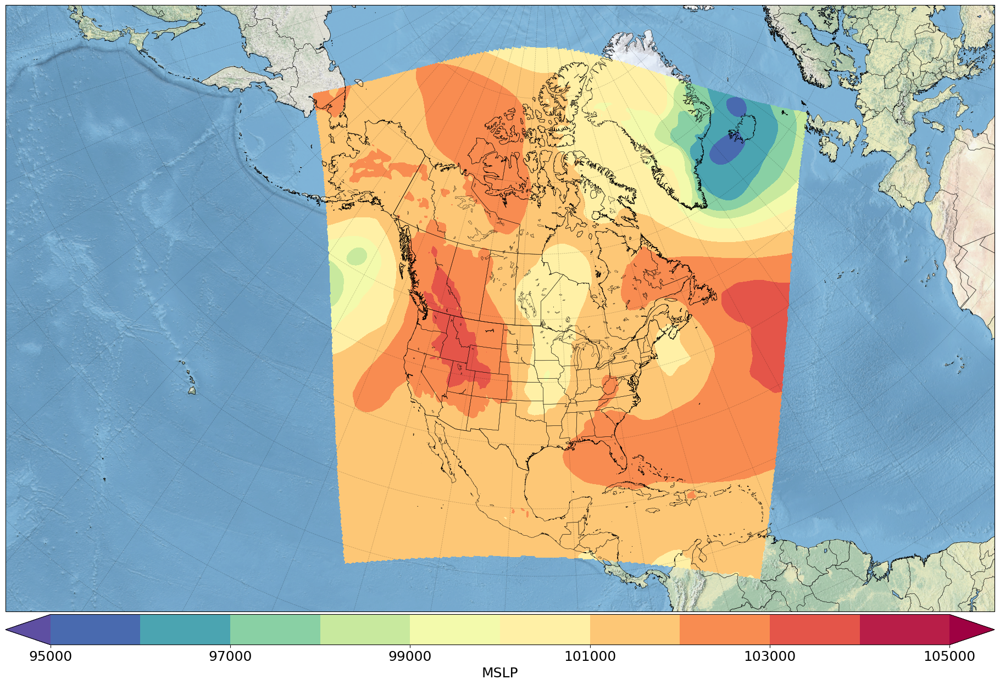

In [32]:
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)

fig, ax = plt.subplots(subplot_kw={'projection': plotcrs},
                       figsize=(18, 16), tight_layout = {'pad': 0})

vmin = 95000
vmax = 105000
step = 1000

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.05, axes_class=plt.Axes)

ax.set_extent([-180, -27, 85, 5], crs=ccrs.PlateCarree())
borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
lakes_color = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#7FB4D8', edgecolor='black')
lakes_edge = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='none', edgecolor='black')
img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
ax.add_feature(lakes_color, zorder=1, linewidth=0.3)
ax.add_feature(lakes_edge, zorder=2, linewidth=0.3)
ax.coastlines(resolution='10m', linewidth=0.4, color='black')
ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

sc = ax.contourf(
    ds_era_masked.longitude, ds_era_masked.latitude, ds_era_masked.msl.isel(time=0),
    transform=ccrs.PlateCarree(),
    levels=np.arange(vmin, vmax+step, step),
    cmap='Spectral_r',
    extend='both'
)

cbar = fig.colorbar(sc, cax=cax, orientation="horizontal", pad=0.02, aspect=20, extend='max')
cbar.set_label("MSLP", fontsize=18)
cbar.ax.tick_params(labelsize=18)

In [3]:
# -------------------------------
# Save the DataArray
# -------------------------------

ds_mask = mask_da.to_dataset(name="mask")
ds_mask.to_netcdf("/home/vdemeyer/projects/rrg-gachon/vdemeyer/MASK/mask_CRCM6_grid_for_ERA5_0_360.nc")

ds_mask = ds_mask.assign_coords({'longitude':(((ds_mask['longitude'] + 180) % 360) - 180)})
ds_mask = ds_mask.sortby(ds_mask['longitude'])
ds_mask.to_netcdf('/home/vdemeyer/projects/rrg-gachon/vdemeyer/MASK/mask_CRCM6_grid_for_ERA5.nc')

<xarray.Dataset> Size: 1MB
Dimensions:    (latitude: 721, longitude: 1440)
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
Data variables:
    mask       (latitude, longitude) bool 1MB False False False ... False False

### Create a mask with a ~200km buffer

In [ ]:
mask_ds = xr.open_dataset('/home/vdemeyer/projects/rrg-gachon/vdemeyer/MASK/mask_CRCM6_grid_for_ERA5_0_360.nc')
mask = mask_ds['mask']

print(f"Masque original - Points True: {mask.sum().values}")

def calc_grid_distance_area(longitude, latitude):
    if longitude.ndim < 2:
        lon, lat = np.meshgrid(longitude, latitude)
    else:
        lon, lat = longitude.values, latitude.values
    dy = np.zeros(lon.shape)
    dx = np.zeros(lat.shape)
    dx[:,1:] = haversine(lon[:,1:], lat[:,1:], lon[:,:-1], lat[:,:-1])
    dy[1:,:] = haversine(lon[1:,:], lat[1:,:], lon[:-1,:], lat[:-1,:])
    dx[:,0] = dx[:,1]
    dy[0,:] = dy[1,:]
    dx = dx * 1e3
    dy = dy * 1e3
    grid_distance = np.mean(np.append(dy[:,:,None], dx[:,:,None], axis=2))
    return grid_distance

def haversine(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    km = 6367 * c
    return km

#### ERA5

In [ ]:
grid_spacing = calc_grid_distance_area(mask.longitude, mask.latitude) / 1000
print(f"Espacement moyen de la grille: {grid_spacing:.2f} km")

erosion_distance_km = 200
erosion_pixels = int(np.ceil(erosion_distance_km / grid_spacing))
print(f"200 km = {erosion_pixels} pixels")

mask_array = mask.values.astype(bool)
mask_eroded = ndimage.binary_erosion(mask_array, iterations=erosion_pixels)

mask_eroded_da = xr.DataArray(
    mask_eroded,
    coords={'latitude': mask.latitude, 'longitude': mask.longitude},
    dims=('latitude', 'longitude'),
    name='mask'
)

print(f"Masque érodé - Points True: {mask_eroded_da.sum().values}")

mask_eroded_ds = mask_eroded_da.to_dataset()
mask_eroded_ds.to_netcdf('/home/vdemeyer/projects/rrg-gachon/vdemeyer/MASK/mask_CRCM6_grid_for_ERA5_0_360_eroded.nc')

Masque original - Points True: 137086
Espacement moyen de la grille: 22.72 km
200 km = 9 pixels
Masque érodé - Points True: 123207


In [18]:
mask_eroded_ds_limited = mask_eroded_ds.reindex(latitude=ds_era_masked.latitude, longitude=ds_era_masked.longitude)
mask_eroded_ds_limited.to_netcdf('/home/vdemeyer/projects/rrg-gachon/vdemeyer/MASK/mask_CRCM6_grid_for_ERA5_0_360_eroded_limited.nc')
mask_eroded_ds_limited

<xarray.Dataset> Size: 240kB
Dimensions:    (latitude: 322, longitude: 732)
Coordinates:
  * latitude   (latitude) float32 1kB 84.75 84.5 84.25 84.0 ... 5.0 4.75 4.5
  * longitude  (longitude) float32 3kB 174.2 174.5 174.8 ... 356.5 356.8 357.0
Data variables:
    mask       (latitude, longitude) bool 236kB False False ... False False

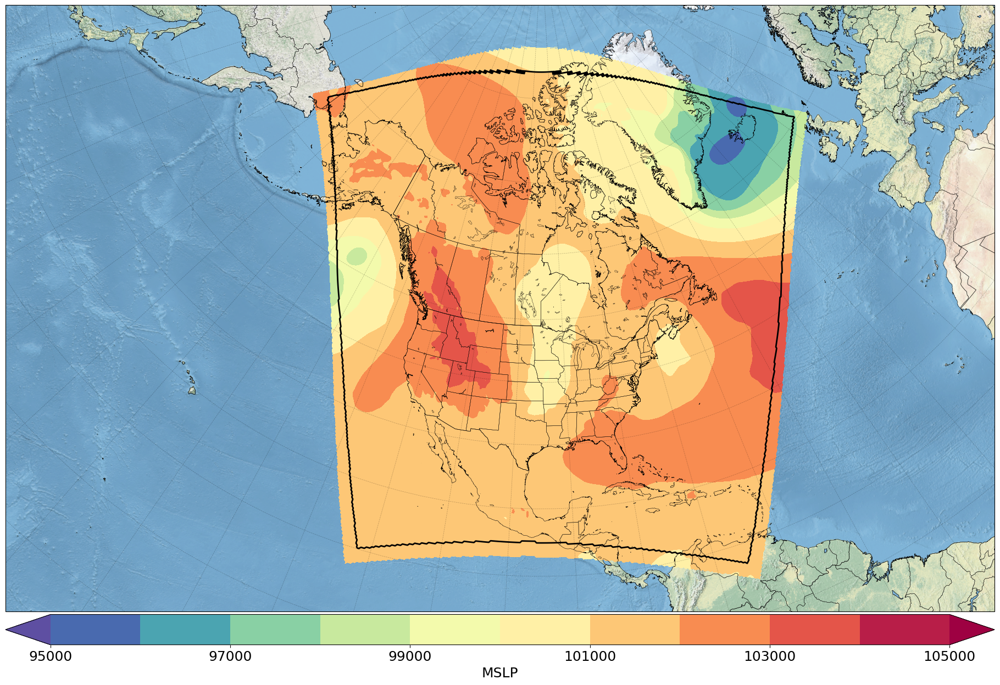

In [19]:
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)

fig, ax = plt.subplots(subplot_kw={'projection': plotcrs},
                       figsize=(18, 16), tight_layout = {'pad': 0})

vmin = 95000
vmax = 105000
step = 1000

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.05, axes_class=plt.Axes)

ax.set_extent([-180, -27, 85, 5], crs=ccrs.PlateCarree())
borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
lakes_color = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#7FB4D8', edgecolor='black')
lakes_edge = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='none', edgecolor='black')
img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
ax.add_feature(lakes_color, zorder=1, linewidth=0.3)
ax.add_feature(lakes_edge, zorder=2, linewidth=0.3)
ax.coastlines(resolution='10m', linewidth=0.4, color='black')
ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

ax.contour(mask_eroded_ds.longitude, mask_eroded_ds.latitude, mask_eroded_ds.mask, levels=[0.5], colors='k', linewidths=2, transform=ccrs.PlateCarree())

sc = ax.contourf(
    ds_era_masked.longitude, ds_era_masked.latitude, ds_era_masked.msl.isel(time=0),
    transform=ccrs.PlateCarree(),
    levels=np.arange(vmin, vmax+step, step),
    cmap='Spectral_r',
    extend='both'
)

cbar = fig.colorbar(sc, cax=cax, orientation="horizontal", pad=0.02, aspect=20, extend='max')
cbar.set_label("MSLP", fontsize=18)
cbar.ax.tick_params(labelsize=18)

#### CRCM6

In [27]:
mask = xr.DataArray(
    np.ones(ds_rot['lon'].shape, dtype=bool),
    coords={
        'rlat': ds_rot['rlat'],
        'rlon': ds_rot['rlon'],
        'lat': (('rlat', 'rlon'), ds_rot['lat'].values),
        'lon': (('rlat', 'rlon'), ds_rot['lon'].values)
    },
    dims=('rlat', 'rlon'),
    name='mask'
)

mask

<xarray.DataArray 'mask' (rlat: 655, rlon: 655)> Size: 429kB
array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]])
Coordinates:
  * rlat     (rlat) float64 5kB -34.62 -34.51 -34.4 -34.28 ... 37.1 37.22 37.33
  * rlon     (rlon) float64 5kB -31.85 -31.74 -31.62 -31.51 ... 39.88 39.99 40.1
    lat      (rlat, rlon) float64 3MB 7.566 7.601 7.637 ... 59.27 59.19 59.11
    lon      (rlat, rlon) float64 3MB -123.0 -122.9 -122.8 ... -3.037 -2.972

In [29]:
grid_spacing = calc_grid_distance_area(ds_rot['lon'], ds_rot['lat']) / 1000
print(f"Espacement moyen de la grille: {grid_spacing:.2f} km")

erosion_distance_km = 200
erosion_pixels = int(np.ceil(erosion_distance_km / grid_spacing))
print(f"200 km = {erosion_pixels} pixels")

mask_array = mask.values.astype(bool)
mask_eroded = ndimage.binary_erosion(mask_array, iterations=erosion_pixels)

mask_eroded_da = xr.DataArray(
    mask_eroded,
    coords={
        'rlat': mask['rlat'],
        'rlon': mask['rlon'],
        'lat': (('rlat', 'rlon'), mask['lat'].values),
        'lon': (('rlat', 'rlon'), mask['lon'].values)
    },
    dims=('rlat', 'rlon'),
    name='mask'
)

print(f"Masque érodé - Points True: {mask_eroded_da.sum().values}")

mask_eroded_ds = mask_eroded_da.to_dataset()
mask_eroded_ds.to_netcdf('/home/vdemeyer/projects/rrg-gachon/vdemeyer/MASK/mask_CRCM6_grid_for_CRCM6_eroded.nc')

Espacement moyen de la grille: 11.83 km
200 km = 17 pixels
Masque érodé - Points True: 385641


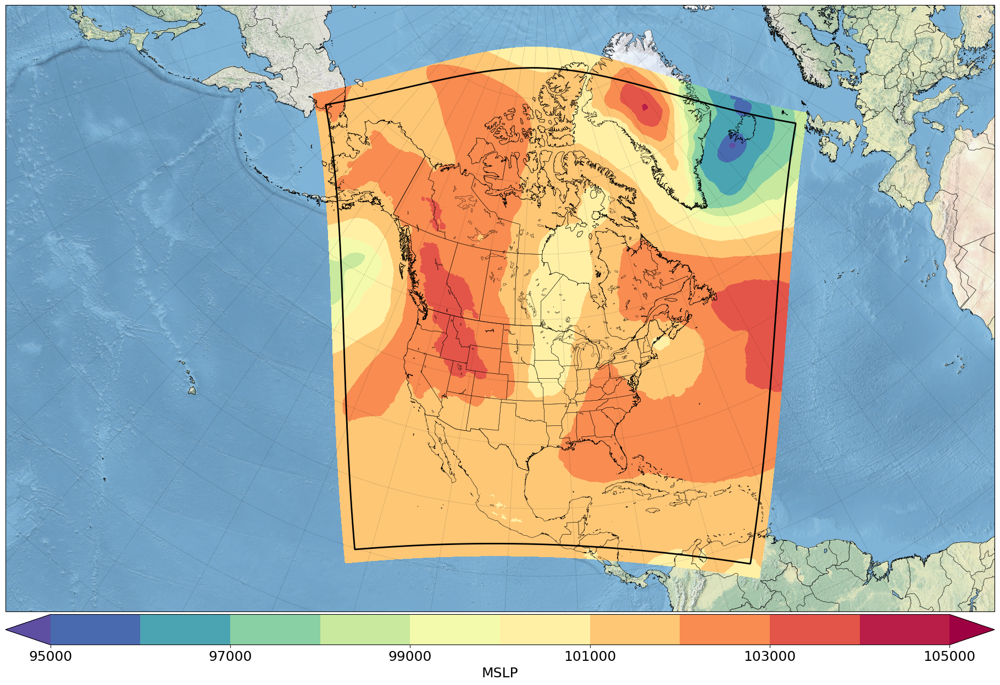

In [31]:
ds_rot = xr.open_dataset('/home/vdemeyer/projects/rrg-gachon/vdemeyer/UBB/PSL/psl_ubb_201201_se.nc')

pole_lon = ds_rot.rotated_pole.attrs['grid_north_pole_longitude']
pole_lat = ds_rot.rotated_pole.attrs['grid_north_pole_latitude']

plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)

fig, ax = plt.subplots(subplot_kw={'projection': plotcrs},
                       figsize=(18, 16), tight_layout = {'pad': 0})

vmin = 95000
vmax = 105000
step = 1000

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.05, axes_class=plt.Axes)

ax.set_extent([-180, -27, 85, 5], crs=ccrs.PlateCarree())
borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
lakes_color = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#7FB4D8', edgecolor='black')
lakes_edge = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='none', edgecolor='black')
img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
ax.add_feature(lakes_color, zorder=1, linewidth=0.3)
ax.add_feature(lakes_edge, zorder=2, linewidth=0.3)
ax.coastlines(resolution='10m', linewidth=0.4, color='black')
ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

ax.contour(mask_eroded_ds.rlon, mask_eroded_ds.rlat, mask_eroded_ds.mask, levels=[0.5], colors='k',
           linewidths=2, transform=ccrs.RotatedPole(pole_longitude=pole_lon, pole_latitude=pole_lat))

sc = ax.contourf(
    ds_rot.rlon, ds_rot.rlat, ds_rot.psl.isel(time=0),
    transform = ccrs.RotatedPole(pole_longitude=pole_lon, pole_latitude=pole_lat),
    levels=np.arange(vmin, vmax+step, step),
    cmap='Spectral_r',
    extend='both'
)

cbar = fig.colorbar(sc, cax=cax, orientation="horizontal", pad=0.02, aspect=20, extend='max')
cbar.set_label("MSLP", fontsize=18)
cbar.ax.tick_params(labelsize=18)